In this notebook we train a RealNVP based flow model to approximate the Double Well Boltzmann Distribution.
Scroll down to the bottom for visualisation of results. 

In [1]:
import sys
sys.path.insert(0, "../")

In [2]:
# import warnings
# warnings.filterwarnings('ignore')

In [3]:
import normflow as nf
import matplotlib.pyplot as plt
import torch

from fab import FABModel, HamiltoneanMonteCarlo, Metropolis
from fab.utils.logging import ListLogger
from fab.utils.plotting import plot_history, plot_contours, plot_marginal_pair
from examples.make_flow import make_wrapped_normflowdist

from fab.utils.prioritised_replay_buffer import PrioritisedReplayBuffer
from fab.train_with_prioritised_buffer import PrioritisedBufferTrainer

/home/laurence/miniconda3/envs/fabtorch/lib/python3.7/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Configure Training

In [26]:
dim: int = 2
n_intermediate_distributions: int = 4
layer_nodes_per_dim = 10
batch_size: int = 128
n_iterations: int = 1000
n_eval = 100
eval_batch_size = batch_size * 10
n_plots: int = 20 # number of plots shows throughout tranining
lr: float = 1e-4
transition_operator_type: str = "hmc"  # "metropolis" or "hmc"
seed: int = 1
n_flow_layers: int = 10
# torch.set_default_dtype(torch.float64)
torch.manual_seed(seed)

In [27]:
# buffer config
n_batches_buffer_sampling = 4
maximum_buffer_length = batch_size * 100
min_buffer_length = batch_size * n_batches_buffer_sampling * 10

## Setup GMM target distribution

In [28]:
loc_scaling = 40
n_mixes = 40

In [29]:
from fab.target_distributions.gmm import GMM
torch.manual_seed(seed)
target = GMM(dim=dim, n_mixes=n_mixes, loc_scaling=loc_scaling, log_var_scaling=1.0)
plotting_bounds = (-loc_scaling*1.4, loc_scaling*1.4)

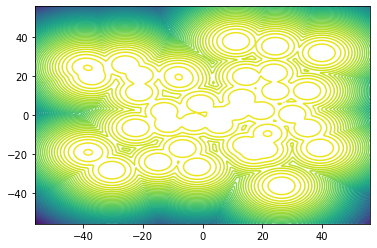

In [30]:
# plot target
fig, ax = plt.subplots()
plot_contours(target.log_prob, bounds=plotting_bounds, n_contour_levels=80, ax=ax, grid_width_n_points=200)

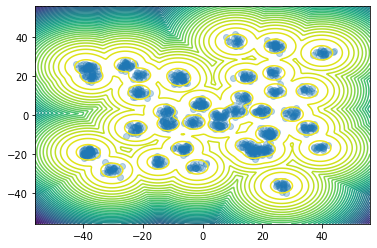

In [31]:
# plot target
fig, ax = plt.subplots()
samples = target.sample((1000,))
ax.plot(samples[:, 0], samples[:, 1], "o", alpha=0.3)
plot_contours(target.log_prob, bounds=plotting_bounds, n_contour_levels=50, ax=ax, grid_width_n_points=200)

## Setup Flow
By wrapping the [normflow library](https://github.com/VincentStimper/normalizing-flows). 

In [32]:
flow = make_wrapped_normflowdist(dim, n_flow_layers=n_flow_layers, 
                                 layer_nodes_per_dim=layer_nodes_per_dim,
                                act_norm = True)

## Setup transition operator

In [33]:
if transition_operator_type == "hmc":
    # very lightweight HMC.
    transition_operator = HamiltoneanMonteCarlo(
        n_ais_intermediate_distributions=n_intermediate_distributions,
        n_outer=1,
        epsilon=1.0, L=5, dim=dim,
        step_tuning_method="p_accept")
elif transition_operator_type == "metropolis":
    transition_operator = Metropolis(n_transitions=n_intermediate_distributions,
                                     n_updates=5, adjust_step_size=True)
else:
    raise NotImplementedError

## Define model, trainer and plotter

In [34]:
fab_model = FABModel(flow=flow,
                     target_distribution=target,
                     n_intermediate_distributions=n_intermediate_distributions,
                     transition_operator=transition_operator)
optimizer = torch.optim.Adam(flow.parameters(), lr=lr)
# scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.995)
scheduler = None
logger = ListLogger(save=False) # save training history

In [35]:
def plot(fab_model, n_samples = 300):
    fig, axs = plt.subplots(1, 3, figsize=(12, 4))

    plot_contours(target.log_prob, bounds=plotting_bounds, ax=axs[0], n_contour_levels=50, grid_width_n_points=200)
    plot_contours(target.log_prob, bounds=plotting_bounds, ax=axs[1], n_contour_levels=50, grid_width_n_points=200)
    plot_contours(target.log_prob, bounds=plotting_bounds, ax=axs[2], n_contour_levels=50, grid_width_n_points=200)

    # plot flow samples
    samples_flow = fab_model.flow.sample((n_samples,))
    plot_marginal_pair(samples_flow, ax=axs[0], bounds=plotting_bounds)


    # plot ais samples
    samples_ais = fab_model.annealed_importance_sampler.sample_and_log_weights(n_samples,
                                                                               logging=False)[0]
    plot_marginal_pair(samples_ais, ax=axs[1], bounds=plotting_bounds)
    
    # plot buffer samples
    samples_buffer = buffer.sample(n_samples)[0]
    plot_marginal_pair(samples_buffer, ax=axs[2], bounds=plotting_bounds)
    
    axs[0].set_title("flow samples")
    axs[1].set_title("ais samples")
    axs[2].set_title("buffer samples")
    plt.show()

In [36]:
# buffer
def initial_sampler():
    x, log_w = fab_model.annealed_importance_sampler.sample_and_log_weights(
            batch_size, logging=False)
    log_q_x = fab_model.flow.log_prob(x)
    return x, log_w, log_q_x
buffer = PrioritisedReplayBuffer(dim=dim, max_length=maximum_buffer_length,
                      min_sample_length=min_buffer_length,
                      initial_sampler=initial_sampler)

In [37]:
trainer = PrioritisedBufferTrainer(model=fab_model, optimizer=optimizer, logger=logger, plot=plot,
                  optim_schedular=scheduler,
                        buffer=buffer,
                        n_batches_buffer_sampling=n_batches_buffer_sampling)

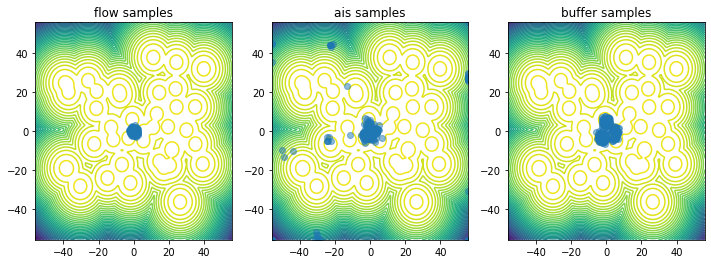

In [38]:
plot(fab_model)

# Run with visualisation

loss: 6.279346942901611, ess base: 0.007946338504552841,ess ais: 0.0078125:   0%|                                                                                                                              | 0/1000 [00:00<?, ?it/s]

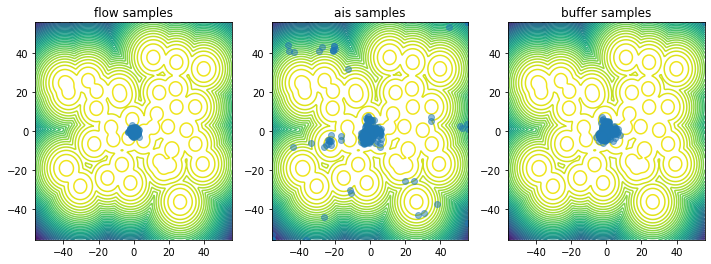

loss: 5.470731735229492, ess base: 0.007850488647818565,ess ais: 0.008006714284420013:   5%|█████▌                                                                                                    | 52/1000 [00:50<21:39,  1.37s/it]

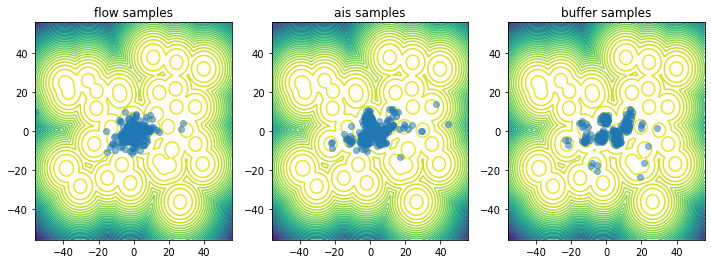

loss: 6.58104133605957, ess base: 0.013837742619216442,ess ais: 0.030868971720337868:   8%|████████▌                                                                                                  | 80/1000 [01:09<06:14,  2.46it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain end.


loss: 7.204255104064941, ess base: 0.01464695855975151,ess ais: 0.010027814656496048:   9%|█████████▊                                                                                                 | 92/1000 [01:23<20:26,  1.35s/it]

1 nan/inf samples/log-probs/log-weights encountered at chain end.


loss: 7.450476169586182, ess base: 0.008040081709623337,ess ais: 0.008719152770936489:  10%|███████████                                                                                              | 105/1000 [01:32<10:18,  1.45it/s]

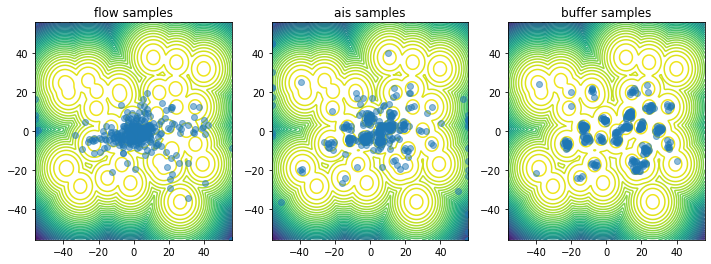

loss: 7.755831718444824, ess base: 0.020231038331985474,ess ais: 0.051871947944164276:  11%|███████████▍                                                                                             | 109/1000 [01:34<07:40,  1.94it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.524568557739258, ess base: 0.030238406732678413,ess ais: 0.025557441636919975:  11%|███████████▋                                                                                             | 111/1000 [01:35<06:22,  2.33it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain end.
1 nan/inf samples/log-probs/log-weights encountered at chain end.
1 nan/inf samples/log-probs/log-weights encountered at chain end.
1 nan/inf samples/log-probs/log-weights encountered at chain end.
1 nan/inf samples/log-probs/log-weights encountered at chain end.


loss: 7.937923908233643, ess base: 0.03248227387666702,ess ais: 0.02791471965610981:  12%|████████████▉                                                                                              | 121/1000 [01:43<05:56,  2.46it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain end.
1 nan/inf samples/log-probs/log-weights encountered at chain end.


loss: 8.054323196411133, ess base: 0.03537089005112648,ess ais: 0.04350484162569046:  13%|██████████████                                                                                             | 131/1000 [01:51<05:51,  2.47it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain end.


loss: 8.138433456420898, ess base: 0.03476504236459732,ess ais: 0.04409676417708397:  14%|███████████████                                                                                            | 141/1000 [02:00<05:48,  2.47it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain end.
2 nan/inf samples/log-probs/log-weights encountered at chain end.
1 nan/inf samples/log-probs/log-weights encountered at chain end.


loss: 8.269598007202148, ess base: nan,ess ais: 0.008100639097392559:  16%|██████████████████▉                                                                                                       | 155/1000 [02:13<11:56,  1.18it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain end.


loss: 8.315042495727539, ess base: 0.024855490773916245,ess ais: 0.046918224543333054:  16%|████████████████▍                                                                                        | 157/1000 [02:15<08:20,  1.68it/s]

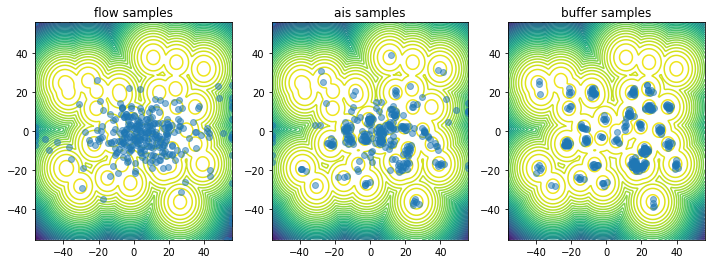

loss: 8.445040702819824, ess base: 0.017584288492798805,ess ais: 0.01354367844760418:  16%|█████████████████                                                                                         | 161/1000 [02:17<06:57,  2.01it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain end.


loss: 8.52224349975586, ess base: 0.019911233335733414,ess ais: 0.04782809317111969:  17%|██████████████████▎                                                                                        | 171/1000 [02:25<05:40,  2.43it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain end.


loss: 8.620960235595703, ess base: 0.0741819515824318,ess ais: 0.04206644743680954:  21%|██████████████████████▋                                                                                     | 210/1000 [02:57<05:40,  2.32it/s]

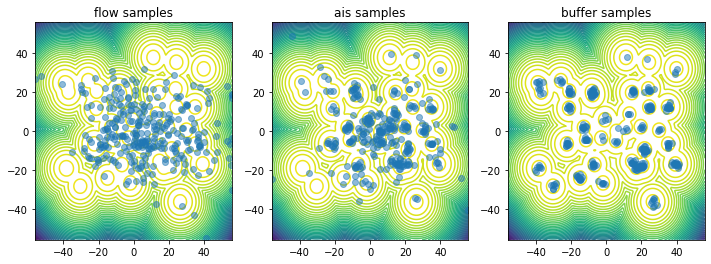

loss: 8.806387901306152, ess base: 0.03453897684812546,ess ais: 0.023610182106494904:  26%|███████████████████████████▊                                                                              | 262/1000 [03:42<05:25,  2.27it/s]

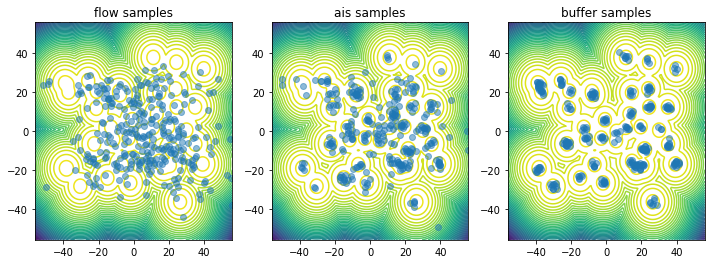

loss: 8.722134590148926, ess base: 0.047856491059064865,ess ais: 0.10259220749139786:  32%|█████████████████████████████████▍                                                                        | 315/1000 [04:30<11:59,  1.05s/it]

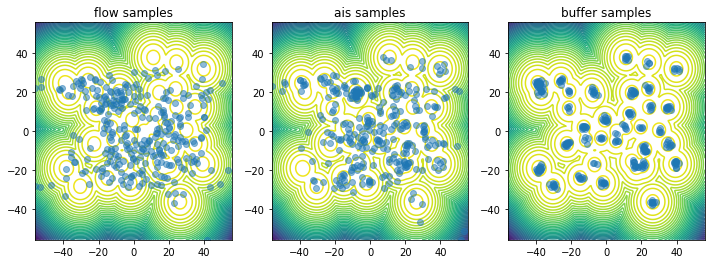

loss: 8.647250175476074, ess base: 0.074781633913517,ess ais: 0.16880743205547333:  37%|████████████████████████████████████████                                                                     | 368/1000 [05:12<07:16,  1.45it/s]

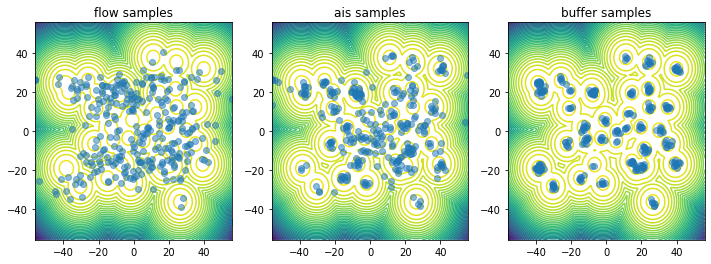

loss: 8.695573806762695, ess base: 0.04121752455830574,ess ais: 0.050209835171699524:  42%|████████████████████████████████████████████▌                                                             | 420/1000 [05:55<05:01,  1.93it/s]

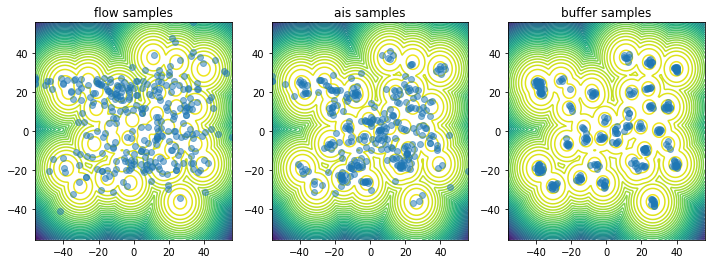

loss: 8.641514778137207, ess base: 0.0349264033138752,ess ais: 0.050571344792842865:  47%|██████████████████████████████████████████████████▌                                                        | 473/1000 [06:37<03:47,  2.32it/s]

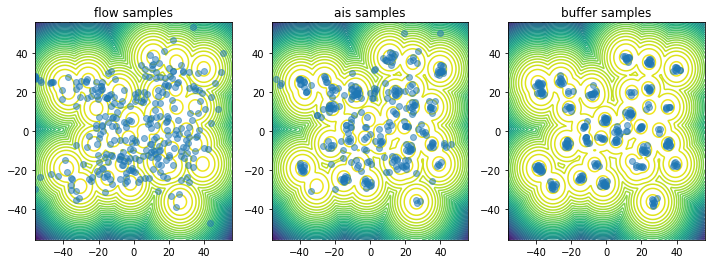

loss: 8.625350952148438, ess base: 0.0865597352385521,ess ais: 0.15479585528373718:  52%|████████████████████████████████████████████████████████▋                                                   | 525/1000 [07:24<14:03,  1.78s/it]

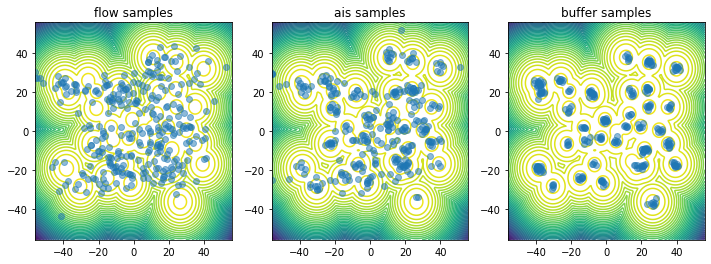

loss: 8.680192947387695, ess base: 0.08307493478059769,ess ais: 0.05513940751552582:  58%|█████████████████████████████████████████████████████████████▊                                             | 578/1000 [08:09<09:19,  1.33s/it]

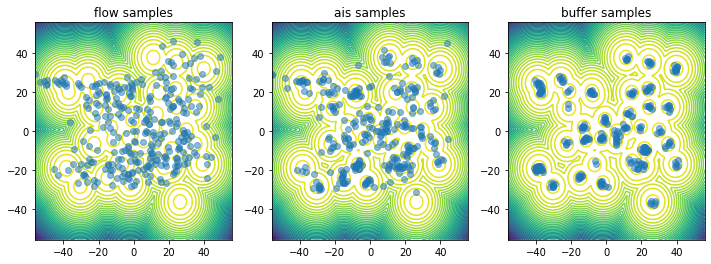

loss: 8.641983985900879, ess base: 0.05522626265883446,ess ais: 0.1124008297920227:  63%|████████████████████████████████████████████████████████████████████                                        | 630/1000 [08:52<04:14,  1.45it/s]

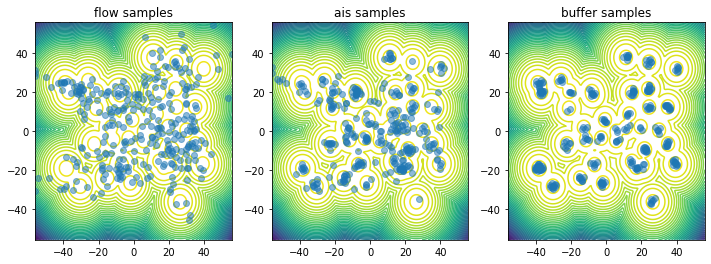

loss: 8.796956062316895, ess base: 0.022784870117902756,ess ais: 0.04105369374155998:  68%|████████████████████████████████████████████████████████████████████████▍                                 | 683/1000 [09:34<02:42,  1.95it/s]

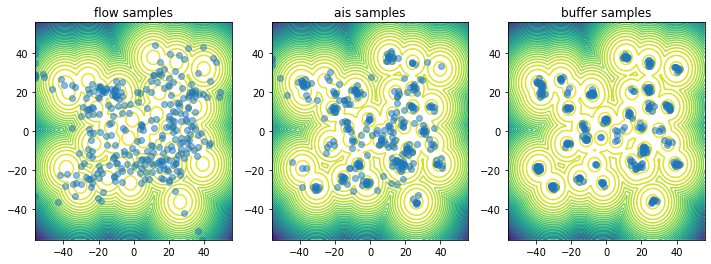

loss: 8.993988990783691, ess base: 0.060959525406360626,ess ais: 0.05104777216911316:  74%|██████████████████████████████████████████████████████████████████████████████                            | 736/1000 [10:17<01:46,  2.49it/s]

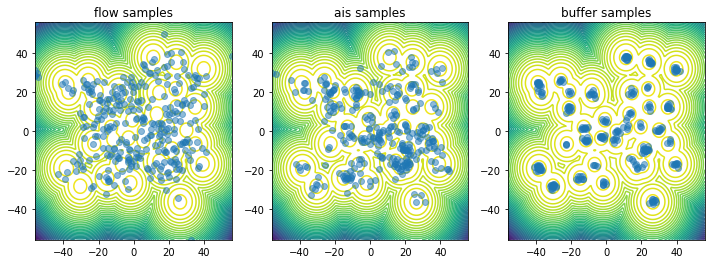

loss: 8.699210166931152, ess base: 0.04920053109526634,ess ais: 0.08872733265161514:  75%|███████████████████████████████████████████████████████████████████████████████▊                           | 746/1000 [10:26<01:45,  2.41it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.919119834899902, ess base: 0.037921417504549026,ess ais: 0.07562831789255142:  79%|███████████████████████████████████████████████████████████████████████████████████▌                      | 788/1000 [11:05<07:41,  2.18s/it]

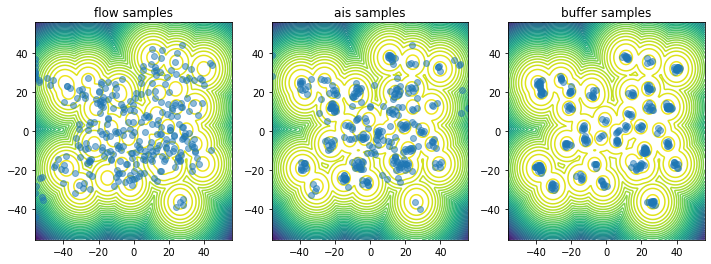

loss: 8.601005554199219, ess base: 0.07229623943567276,ess ais: 0.11846417188644409:  82%|███████████████████████████████████████████████████████████████████████████████████████▍                   | 817/1000 [11:25<01:13,  2.48it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain end.


loss: 8.688874244689941, ess base: nan,ess ais: 0.09294098615646362:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 834/1000 [11:47<02:46,  1.01s/it]

1 nan/inf samples/log-probs/log-weights encountered at chain end.


loss: 8.72881031036377, ess base: nan,ess ais: 0.07452275604009628:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 840/1000 [11:54<02:59,  1.12s/it]

1 nan/inf samples/log-probs/log-weights encountered at chain end.


loss: 8.630619049072266, ess base: 0.07272867858409882,ess ais: 0.12098628282546997:  84%|█████████████████████████████████████████████████████████████████████████████████████████▉                 | 841/1000 [11:55<02:21,  1.12it/s]

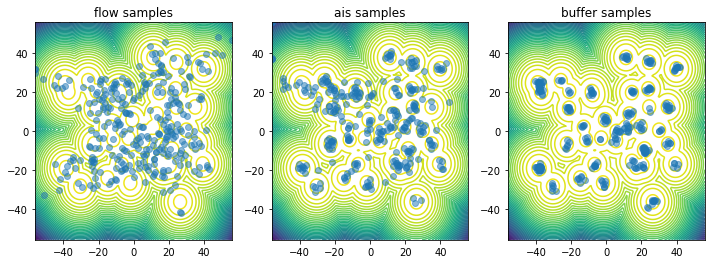

loss: 8.394503593444824, ess base: 0.07124116271734238,ess ais: 0.10392173379659653:  85%|██████████████████████████████████████████████████████████████████████████████████████████▋                | 848/1000 [12:03<04:38,  1.83s/it]

1 nan/inf samples/log-probs/log-weights encountered at chain end.


loss: 8.56993579864502, ess base: nan,ess ais: 0.17335723340511322:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 861/1000 [12:12<01:57,  1.18it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain end.


loss: 8.63630199432373, ess base: nan,ess ais: 0.08046887814998627:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 874/1000 [12:21<01:05,  1.92it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain end.


loss: 8.6531400680542, ess base: 0.06973842531442642,ess ais: 0.14614437520503998:  88%|███████████████████████████████████████████████████████████████████████████████████████████████▌             | 877/1000 [12:23<00:50,  2.43it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain end.


loss: 8.57552433013916, ess base: 0.05920065566897392,ess ais: 0.13463141024112701:  89%|████████████████████████████████████████████████████████████████████████████████████████████████▍           | 893/1000 [12:38<01:14,  1.43it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain end.


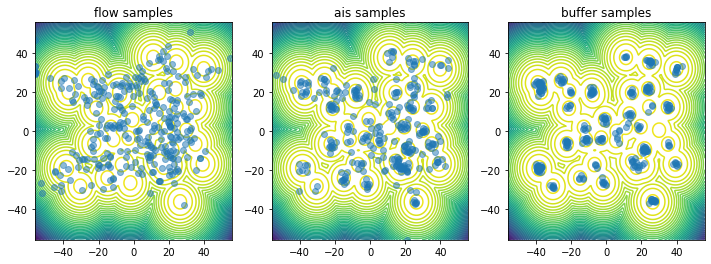

loss: 8.47305679321289, ess base: 0.0560789629817009,ess ais: 0.0679146945476532:  91%|███████████████████████████████████████████████████████████████████████████████████████████████████▉          | 908/1000 [12:48<00:38,  2.40it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain end.


loss: 9.517250061035156, ess base: 0.0629647970199585,ess ais: 0.09118697047233582:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████▏        | 918/1000 [12:57<00:33,  2.44it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain end.


loss: 8.506124496459961, ess base: 0.06048617511987686,ess ais: 0.0436742790043354:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 938/1000 [13:13<00:25,  2.43it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain end.


loss: 8.494165420532227, ess base: nan,ess ais: 0.09684018045663834:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 946/1000 [13:20<00:25,  2.12it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain end.


loss: 8.702303886413574, ess base: 0.0574059896171093,ess ais: 0.05066084861755371:  95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 946/1000 [13:21<00:25,  2.12it/s]

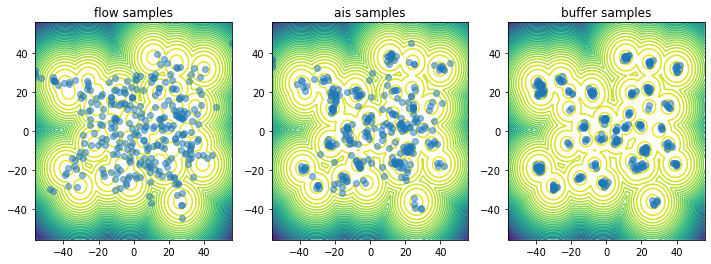

loss: 8.469269752502441, ess base: nan,ess ais: 0.05382569879293442:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 948/1000 [13:22<00:30,  1.71it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain end.


loss: 8.62275218963623, ess base: 0.08744718879461288,ess ais: 0.07214231044054031:  95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 948/1000 [13:22<00:30,  1.71it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain end.


loss: 8.307940483093262, ess base: 0.06516283750534058,ess ais: 0.05411083996295929:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 958/1000 [13:31<00:17,  2.38it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain end.


loss: 8.555646896362305, ess base: nan,ess ais: 0.06564489752054214: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 995/1000 [14:02<00:02,  1.92it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain end.


loss: 8.525114059448242, ess base: 0.04569265991449356,ess ais: 0.08807797729969025: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 999/1000 [14:04<00:00,  2.57it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


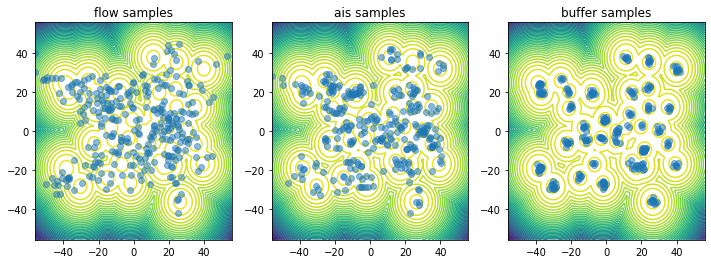

loss: 8.525114059448242, ess base: 0.04569265991449356,ess ais: 0.08807797729969025: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [14:09<00:00,  1.18it/s]


In [39]:
# the nan's that arrise during the training are typically extreme flow samples (e.g. x=[100, 100]), 
# which give Nan values for the target density. However, these do not harm long term training.
trainer.run(n_iterations=n_iterations, batch_size=batch_size, n_plot=n_plots, \
            n_eval=n_eval, eval_batch_size=eval_batch_size, save=False)

In the below plot:
ess = effective sample size
"Distance" refers to the distance moved during each intermediate transition. 

NaN encountered in ess_base history
NaN encountered in average_distance_dist0 history
NaN encountered in average_distance_dist_3 history
NaN encountered in eval_ess_flow_p_target history
NaN encountered in eval_ess_flow_p2overq_target history


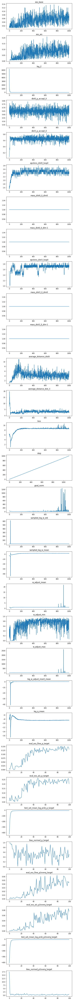

In [40]:
plot_history(logger.history)

## Visualise Trained Flow Model

In [ ]:
# plot samples on top of contours
n_samples = 500
fig, axs = plt.subplots(1, 3, figsize=(10, 3))
plot_contours(target.log_prob, bounds=plotting_bounds, ax=axs[0], n_contour_levels=50)
plot_contours(target.log_prob, bounds=plotting_bounds, ax=axs[1], n_contour_levels=50)
# plot flow samples
samples_flow = fab_model.flow.sample((n_samples,))
plot_marginal_pair(samples_flow, ax=axs[0], bounds=plotting_bounds)
axs[0].set_title("flow samples vs target contours")
# plot ais samples
samples_ais = fab_model.annealed_importance_sampler.sample_and_log_weights(n_samples,
                                                                           logging=False)[0]
plot_marginal_pair(samples_ais, ax=axs[1], bounds=plotting_bounds)
axs[1].set_title("ais samples vs target contours")


samples = target.sample((1000,))
axs[2].plot(samples[:, 0], samples[:, 1], "o", alpha=0.3)
plot_contours(target.log_prob, bounds=plotting_bounds, n_contour_levels=50, ax=axs[2])
axs[2].set_title("target samples vs target contours")
plt.tight_layout()